### Setting up the environment


In [1]:
#@title check gpu
!nvidia-smi

Mon Mar  6 11:10:34 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P0    30W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
#@title Install dependencies
# install dependencies: (use cu101 because colab has CUDA 10.1)
#!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab
!pip install fvcore
!pip install -U iopath

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 KB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp38-cp38-linux_x86_64.whl size=44089 sha256=bd0aa686fd44b94193b927784f39ca17194fdf534d38b52c2b0450883f633ea0
  Stored in directory: /root/.cache/pip/wheels/52/dd/2b/10ff8b0ac81b93946bb5fb9e6749bae2dac246506c8774e6cf
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheel

In [3]:
#@title Installing detectron
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
# !git clone 'https://github.com/facebookresearch/detectron2'
# dist = distutils.core.run_setup("./detectron2/setup.py")
# !python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
# sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-cibquffs
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-cibquffs
  Resolved https://github.com/facebookresearch/detectron2.git to commit 778fedc7397ed4cf9f7aa4a7718b87ee1b6b62a9
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 KB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 KB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 45.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117

In [4]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  1.13 ; cuda:  cu116
detectron2: 0.6


In [5]:
#@title Importing libraries
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances

In [6]:
#@title downloading custom dataset from roboflow
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="NpLdedOQy7uhVTtukK8P")
project = rf.workspace("datasetconversion").project("aml-hw1")
dataset = project.version(1).download("coco")


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 KB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 701.2/701.2 KB 22.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=85949ed5e0287a2b6f434116cfd9a1c493d3dd871922c35d940d98d6cf5801a6
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 5.1
    Uninstalling PyYAML-5.1:
      Successfully uninstalled PyYAML-5.1
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
 

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to AML-HW1-1 in coco:: 100%|██████████| 184/184 [00:00<00:00, 1154.33it/s]


### Faster RCNN using Detectron2



In [7]:
# regestering datasets
register_coco_instances("train_data", {}, "/content/AML-HW1-1/train/_annotations.coco.json", "/content/AML-HW1-1/train")
register_coco_instances("val_dataset", {}, "/content/AML-HW1-1/valid/_annotations.coco.json", "/content/AML-HW1-1/valid")
register_coco_instances("test_dataset", {}, "/content/AML-HW1-1/test/_annotations.coco.json", "/content/AML-HW1-1/test")

In [8]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [15]:
#training

from detectron2.engine import DefaultTrainer
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_C4_1x.yaml"))
cfg.DATASETS.TRAIN = ("train_data",)
cfg.DATASETS.TEST = ("test_dataset",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_C4_1x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 16 # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300   # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES =  3 # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[03/06 11:47:42 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[03/06 11:47:42 d2.engine.train_loop]: Starting training from iteration 0
[03/06 11:49:19 d2.utils.events]:  eta: 0:22:12  iter: 19  total_loss: 2.09  loss_cls: 1.357  loss_box_reg: 0.6265  loss_rpn_cls: 0.1067  loss_rpn_loc: 0.007354  time: 4.7991  last_time: 4.9545  data_time: 0.3468  last_data_time: 0.4797   lr: 1.6068e-05  max_mem: 11485M
[03/06 11:50:54 d2.utils.events]:  eta: 0:20:32  iter: 39  total_loss: 1.8  loss_cls: 1.084  loss_box_reg: 0.6246  loss_rpn_cls: 0.1066  loss_rpn_loc: 0.006409  time: 4.7747  last_time: 4.7121  data_time: 0.3190  last_data_time: 0.2686   lr: 3.2718e-05  max_mem: 11485M
[03/06 11:52:29 d2.utils.events]:  eta: 0:18:53  iter: 59  total_loss: 1.38  loss_cls: 0.6567  loss_box_reg: 0.6233  loss_rpn_cls: 0.08921  loss_rpn_loc: 0.006389  time: 4.7644  last_time: 4.7813  data_time: 0.3174  last_data_time: 0.3000   lr: 4.9367e-05  max_mem: 11485M
[03/06 11:54:04 d2.utils.events]:  eta: 0:17:17  iter: 79  total_loss: 1.124  loss_cls: 0.4206  loss_box_reg: 0.

In [17]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 10429), started 0:36:03 ago. (Use '!kill 10429' to kill it.)

<IPython.core.display.Javascript object>

In [18]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[03/06 12:22:04 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


WARNING [03/06 12:22:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/06 12:22:07 d2.data.datasets.coco]: Loaded 18 images in COCO format from /content/AML-HW1-1/valid/_annotations.coco.json
{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[235.1825, 318.2495, 498.6369, 487.7382]], device='cuda:0')), scores: tensor([0.9916], device='cuda:0'), pred_classes: tensor([2], device='cuda:0')])}


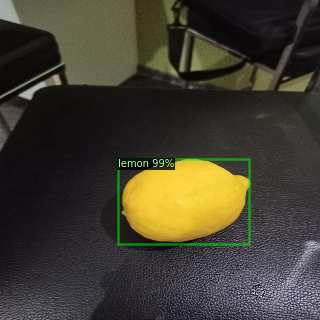

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[221.3773, 240.8043, 382.3713, 358.5228]], device='cuda:0')), scores: tensor([0.9993], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


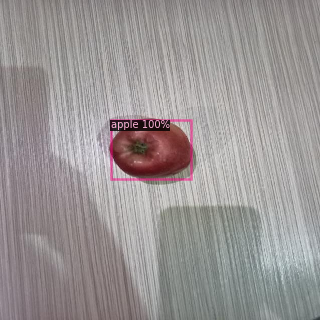

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[214.3630, 300.2326, 500.4971, 506.5934]], device='cuda:0')), scores: tensor([0.9789], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


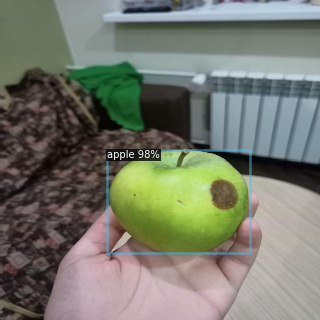

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[157.6499, 140.7337, 457.1003, 401.2431]], device='cuda:0')), scores: tensor([0.9980], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


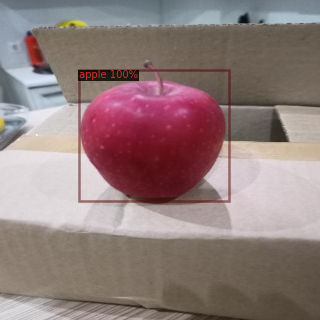

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[313.2387, 267.1838, 448.1739, 375.4876]], device='cuda:0')), scores: tensor([0.9830], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


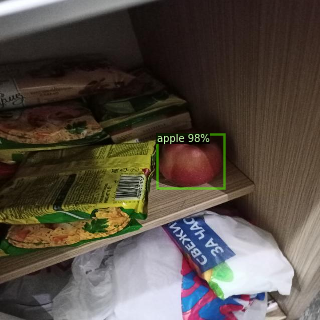

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[221.3753, 133.1543, 431.9063, 415.6930]], device='cuda:0')), scores: tensor([0.9977], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


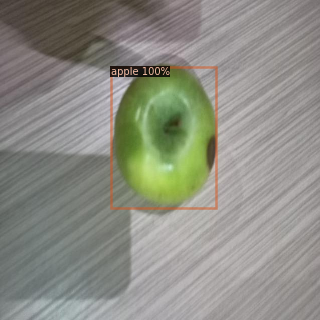

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[129.5611, 151.5686, 279.0312, 258.3782]], device='cuda:0')), scores: tensor([0.9795], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


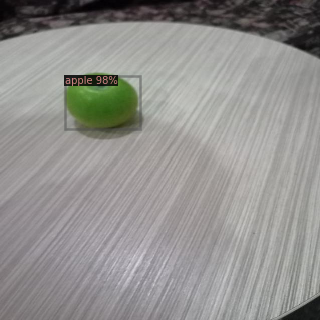

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[281.0948,  63.9787, 454.0424, 272.1040]], device='cuda:0')), scores: tensor([0.9825], device='cuda:0'), pred_classes: tensor([2], device='cuda:0')])}


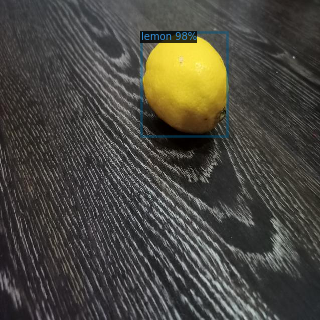

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[312.1531, 107.3733, 517.9775, 382.4748]], device='cuda:0')), scores: tensor([0.9726], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


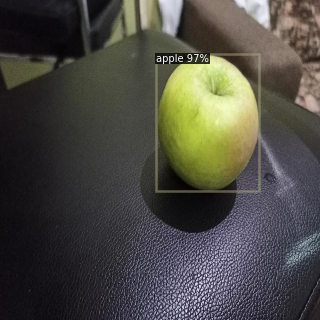

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[149.0223, 194.2311, 528.6391, 467.7979]], device='cuda:0')), scores: tensor([0.9767], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


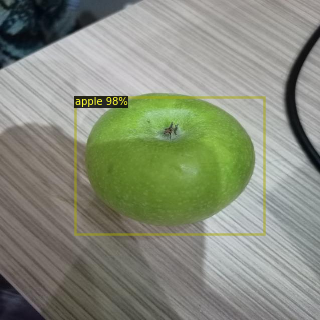

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[459.9065, 156.6782, 614.3185, 279.7466]], device='cuda:0')), scores: tensor([0.9579], device='cuda:0'), pred_classes: tensor([2], device='cuda:0')])}


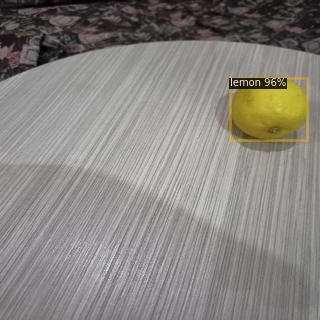

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[135.0119, 250.5016, 188.4841, 305.1290]], device='cuda:0')), scores: tensor([0.9477], device='cuda:0'), pred_classes: tensor([2], device='cuda:0')])}


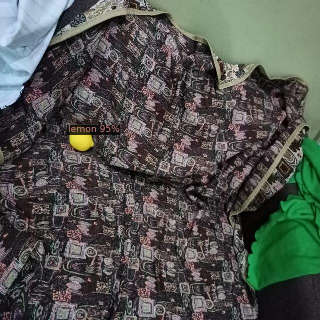

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[261.7607, 383.2254, 384.8549, 461.1968]], device='cuda:0')), scores: tensor([0.9980], device='cuda:0'), pred_classes: tensor([2], device='cuda:0')])}


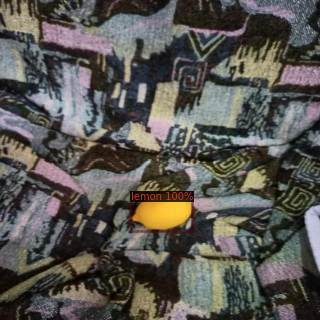

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[302.7150, 381.7796, 403.2188, 489.5086]], device='cuda:0')), scores: tensor([0.9911], device='cuda:0'), pred_classes: tensor([2], device='cuda:0')])}


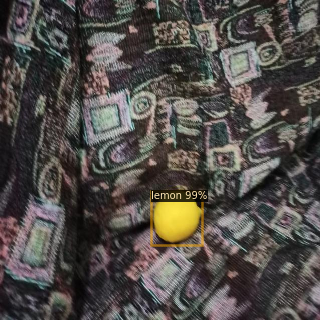

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[254.0760,  49.0922, 408.3581, 173.7177]], device='cuda:0')), scores: tensor([0.9850], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


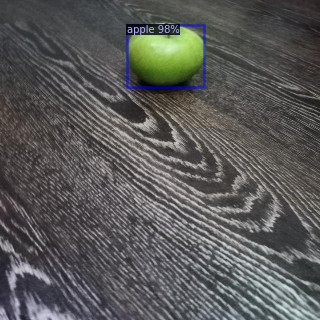

{'instances': Instances(num_instances=2, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[202.3258, 322.8089, 426.8898, 542.5253],
        [378.3091, 339.2196, 428.5263, 379.2279]], device='cuda:0')), scores: tensor([0.9781, 0.7717], device='cuda:0'), pred_classes: tensor([2, 1], device='cuda:0')])}


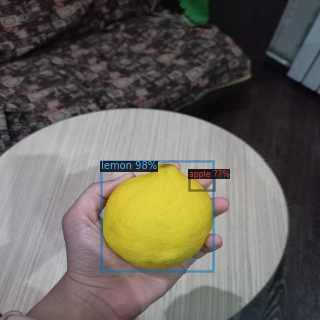

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[355.1724, 336.3983, 472.5794, 427.7468]], device='cuda:0')), scores: tensor([0.9935], device='cuda:0'), pred_classes: tensor([2], device='cuda:0')])}


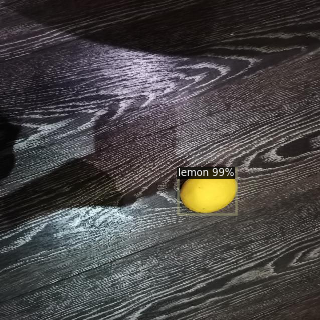

{'instances': Instances(num_instances=1, image_height=640, image_width=640, fields=[pred_boxes: Boxes(tensor([[186.7378, 246.4982, 260.1289, 309.2594]], device='cuda:0')), scores: tensor([0.9941], device='cuda:0'), pred_classes: tensor([1], device='cuda:0')])}


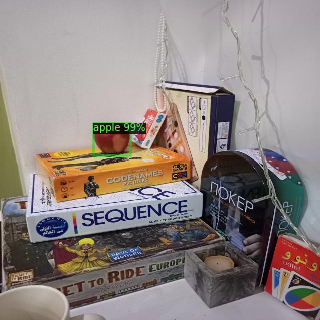

In [19]:
dataset_dicts = DatasetCatalog.get("val_dataset")
metadata = MetadataCatalog.get("val_dataset")

import random
from detectron2.utils.visualizer import ColorMode

for d in dataset_dicts:
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    print(outputs)
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
    out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])